In [1]:
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score


reviews = pd.read_csv("reviews.csv")

In [2]:
reviews.head()

,hotelname,rating,reviewcontent,reviewtitle
0,Hotel Villa Piras,30,My husband and I stayed here for two nights. I...,"Poor Management, Nice Staff"
1,Hotel Villa Piras,40,We arrived at the hotel late afternoon to a wa...,Lovely hotel on the hill
2,Hotel Punta Negra,50,My wife and i stayed for 3 nights in early Sep...,Had a really lovely time
3,Grande Baia Resort & SPA,30,PROS:,Honeymoon stay
4,Hotel Cala Cuncheddi,50,We have spent 2 holidays in this place and boo...,"Best family holidays, great service&beautiful ..."


In [4]:
reviews["rating"].value_counts()

50    24191
40     9984
30     2907
20     1174
10      850
Name: rating, dtype: int64

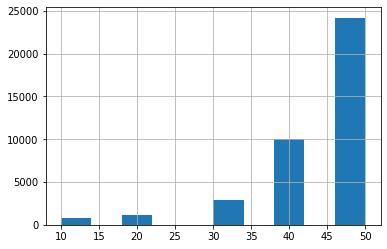

In [5]:
#observe the data (highly unbalanced)

reviews["rating"].hist()
plt.show()

In [6]:
#assign scores from sentiwordnet

from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords,  wordnet as wn, sentiwordnet as swn
from nltk import word_tokenize, pos_tag
import inflect
from contractions import contractions_dict
import re


#nltk.download('averaged_perceptron_tagger')
#nltk.download('sentiwordnet')

# Instantiate the WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()
 

    
#expand contractions. e.g "don't" to "do not"    
def expand_contractions(text, contraction_mapping=contractions_dict):
    
    contractions_pattern = re.compile('({})'.format('|'.join(contraction_mapping.keys())), 
                                      flags=re.IGNORECASE|re.DOTALL)
    def expand_match(contraction):
        match = contraction.group(0)
        first_char = match[0]
        expanded_contraction = contraction_mapping.get(match)\
                                if contraction_mapping.get(match)\
                                else contraction_mapping.get(match.lower())                       
        expanded_contraction = first_char+expanded_contraction[1:]
        return expanded_contraction
        
    expanded_text = contractions_pattern.sub(expand_match, text)
    expanded_text = re.sub("'", "", expanded_text)
    return expanded_text


#assign tags for lemmatization
def penn_to_wn(tag):
    """
    Convert pennTreeBank tags to simple Wordnet tags
    """
    if tag.startswith('J'):
        return wn.ADJ
    elif tag.startswith('N'):
        return wn.NOUN
    elif tag.startswith('R'):
        return wn.ADV
    elif tag.startswith('V'):
        return wn.VERB
    return None
 

#preprocessing the text
def clean_text(review):
    
    review = review.replace("<br />", " ")
    
    #remove contractions
    review = expand_contractions(review)
    
    # Tokenize the article: tokens
    tokens = word_tokenize(review)
    
    # Convert the tokens into lowercase: lower_tokens
    lower_tokens = [t.lower() for t in tokens]
    
    #Convert digits to words
    p = inflect.engine()
    alpha_num_tokens = [p.number_to_words(t) if t.isdigit() else t for t in lower_tokens]
    
    #Remove all punctuations
    alpha_tokens = [t for t in alpha_num_tokens if t.isalpha()]
    
    #Remove all stop words except no and not
    stop_words = stopwords.words('english')
    stop_words.remove('not')
    stop_words.remove('no')
    no_stops = [t for t in alpha_tokens if t not in stop_words]
    
    return no_stops


#Return a sentiment polarity: 0 = negative, 1 = positive
def swn_classifier(review):
 
    sentiment = 0.0
    tokens_count = 0
 
    #preprocess text
    review = clean_text(review)
    
    #Assign nltk pos(part of speech) tags which will later be used for lemmatization
    tagged_review = pos_tag(review)
 
    #Calculating score
    for word, tag in tagged_review:
        
        wn_tag = penn_to_wn(tag)
        if wn_tag not in (wn.NOUN, wn.ADJ, wn.ADV):
            continue
 
        lemma = lemmatizer.lemmatize(word, pos=wn_tag)
        if not lemma:
            continue
 
        synsets = wn.synsets(lemma, pos=wn_tag)
        if not synsets:
            continue
        
        # Take the first synset, the most common
        synset = synsets[0]
        swn_synset = swn.senti_synset(synset.name())
        print()
 
        #sentiment is the difference between positive and negative score
        sentiment += swn_synset.pos_score() - swn_synset.neg_score()
        tokens_count += 1
 
    # Default: neither positive, nor negative
    if not tokens_count:
        return 0
 
    return sentiment

In [7]:
#use both review title and review content columns to predict score

reviews["full_review"] = reviews["reviewtitle"] + ' ' + reviews["reviewcontent"]

#array to store predicted score
y_predicted = []

#calling the main calculate function
for review in reviews["full_review"]:
    y_predicted.append(swn_classifier(review))

In [8]:
len(y_predicted)

39106

In [9]:
#Classify reviews according to setiment score assigned
#1 : positive, 0 : neutral, -1 : negative 

y_classified = []
for i in y_predicted:
    if i > 0:
        y_classified.append(1)
    elif i<0:
        y_classified.append(-1)
    elif i==0:
        y_classified.append(0)

In [10]:
len(y_classified)

39106

In [11]:
reviews["sentiment_score"] = y_predicted
reviews["sentiment"] = y_classified

In [12]:
reviews.head()

,hotelname,rating,reviewcontent,reviewtitle,full_review,sentiment_score,sentiment
0,Hotel Villa Piras,30,My husband and I stayed here for two nights. I...,"Poor Management, Nice Staff","Poor Management, Nice Staff My husband and I s...",0.125,1
1,Hotel Villa Piras,40,We arrived at the hotel late afternoon to a wa...,Lovely hotel on the hill,Lovely hotel on the hill We arrived at the hot...,1.375,1
2,Hotel Punta Negra,50,My wife and i stayed for 3 nights in early Sep...,Had a really lovely time,Had a really lovely time My wife and i stayed ...,1.250,1
3,Grande Baia Resort & SPA,30,PROS:,Honeymoon stay,Honeymoon stay PROS:,0.625,1
4,Hotel Cala Cuncheddi,50,We have spent 2 holidays in this place and boo...,"Best family holidays, great service&beautiful ...","Best family holidays, great service&beautiful ...",5.875,1


In [13]:
reviews["sentiment"].value_counts()

 1    32112
-1     5719
 0     1275
Name: sentiment, dtype: int64

In [15]:
#observe the result

reviews.groupby(["sentiment","rating"]).count()

hotelname  reviewcontent  reviewtitle  full_review  \
sentiment rating                                                       
-1        10            628            628          628          628   
          20            714            714          714          714   
          30           1006           1006         1006         1006   
          40           1421           1421         1421         1421   
          50           1950           1950         1950         1950   
 0        10             48             48           48           48   
          20             53             53           53           53   
          30            119            119          119          119   
          40            330            330          330          330   
          50            725            725          725          725   
 1        10            174            174          174          174   
          20            407            407          407          407   
          30           1782           1782         1782         1782   
          40           8233           8233         8233         8233   
          50          21516          21516        21516        21516   

                  sentiment_score  
sentiment rating                   
-1        10                  628  
          20                  714  
          30                 1006  
          40                 1421  
          50                 1950  
 0        10                   48  
          20                   53  
          30                  119  
          40                  330  
          50                  725  
 1        10                  174  
          20                  407  
          30                 1782  
          40                 8233  
          50                21516

In [16]:
reviews.to_csv('classified_full_reviews.csv', header=True)

In [17]:
#In order to get accuracy, consider the true sentiment according to rating given by user

y_actual = []

for i in range(reviews.shape[0]):
    if reviews["rating"][i] < 30:
        y_actual.append(-1)
    elif reviews["rating"][i] == 30:
        y_actual.append(0)
    elif reviews["rating"][i] > 30:
        y_actual.append(1)

In [18]:
#print metrics

print(confusion_matrix(y_actual, y_classified, labels=[-1, 0, 1]))

print(accuracy_score(y_actual, y_classified))

print (classification_report(y_actual, y_classified))

[[ 1342   101   581]
 [ 1006   119  1782]
 [ 3371  1055 29749]]
0.7980872500383572
              precision    recall  f1-score   support

          -1       0.23      0.66      0.35      2024
           0       0.09      0.04      0.06      2907
           1       0.93      0.87      0.90     34175

    accuracy                           0.80     39106
   macro avg       0.42      0.52      0.43     39106
weighted avg       0.83      0.80      0.81     39106

